In [1]:
from __future__ import print_function
%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
from torch.autograd import Variable
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Взводим руками рандом сид для воспроизводимости обучения
manualSeed = 333
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  333


In [2]:
# Connect to google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Отмечу, что на colab'е, к сожалению, есть проблема с отключением, поэтому я обучил сеть примерно на 1000 эпохаха, а потом запустил 100 эпох, чтобы Вы просто смогли понаблюдать за результатом. При каждой итерации я сохранял состояние сети.

In [0]:
# Директория с датасетом покемонов. Внимание!!! Чтобы даталоадер работал, необходимо положить картинки в 
# папку по типу .../pokemon/1/0.png, .../pokemon/1/1.png и т.д. Без этого даталоадер работать не будет
dataroot = "./drive/My Drive/dz"

# Количество воркеров для даталоадера
workers = 8

# Размер батча для обучения
batch_size = 64

# Размер картинки
image_size = 64

# Размер скрытого вектора z
nz = 100

# Кол-во эпох обучения
# Сделаем столько эпох просто для показа примера
num_epochs = 100

Current device : cuda:0


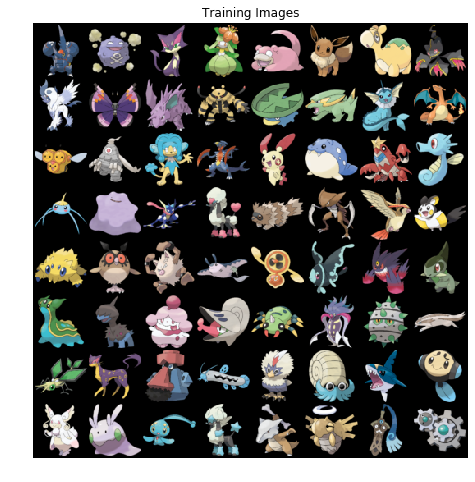

In [4]:
# Создаем даталоадер
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# переключаемся на куду
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

print("Current device : {}".format(device))

# Выведем трейнсет, дабы убедиться, что все завелось
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [0]:
# функция для инициализации весов из статьи про GAN
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [0]:
# Генератор

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        cur_size = 64
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, cur_size * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(cur_size * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(cur_size * 8, cur_size * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(cur_size * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(cur_size * 4, cur_size * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(cur_size * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(cur_size * 2, cur_size, 4, 2, 1, bias=False),
            nn.BatchNorm2d(cur_size),
            nn.ReLU(True),
            nn.ConvTranspose2d(cur_size, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [7]:
# Создали генератор
netG = Generator().to(device)

# Инициализировали его
netG.apply(weights_init)

# Вывели модель для отладки
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [0]:
# Дискриминатор
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        cur_size = 64
        self.main = nn.Sequential(
            nn.Conv2d(3, cur_size, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(cur_size, cur_size * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(cur_size * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(cur_size * 2, cur_size * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(cur_size * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(cur_size * 4, cur_size * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(cur_size * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(cur_size * 8, 1, 4, 1, 0, bias=False),
        )

    def forward(self, input):
        return self.main(input)

In [9]:
# Создали дискриминатор
netD = Discriminator().to(device)

# Ининциализировали весе
netD.apply(weights_init)

# Вывели модель для отладки
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)


In [0]:
# Фиксированный шум для мониторинга качества генерации
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Коэффициент обучения
lr = 0.00005

# Оптимизаторы для сеток
optimizerD = optim.RMSprop(netD.parameters(), lr=lr)
optimizerG = optim.RMSprop(netG.parameters(), lr=lr)

In [0]:
# код для обучения дискриминатора

# Сдеаем всё плавнее
def clamp(discriminator):
    for i in discriminator.parameters():
        i.data.clamp_(-0.01, 0.01)

        
def train_D(discriminator, images, fake_images):
    discriminator.zero_grad()
    real_ans = discriminator(images)
    fake_ans = discriminator(fake_images)   
    loss = torch.mean(fake_ans) - torch.mean(real_ans)
    loss.backward()
    optimizerD.step()
    real_sc = discriminator(images).view(-1)
    fake_sc = discriminator(fake_images.detach()).view(-1)
    clamp(discriminator)       
    return loss, real_sc, fake_sc

In [0]:
# код для обучения генератора
def train_G(generator, discriminator, fake_images):
    generator.zero_grad()
    fake_ans = discriminator(fake_images)    
    loss = -torch.mean(fake_ans)
    loss.backward()
    optimizerG.step()
    return loss

In [13]:
# Training Loop
input = torch.FloatTensor(batch_size, 3, image_size, image_size).cuda()
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

d_episodes = 5

print("Starting Training Loop...")
for epoch in range(num_epochs):
    
    netD.load_state_dict(torch.load('drive/My Drive/netD_model'))
    netG.load_state_dict(torch.load('drive/My Drive/netG_model'))
    
    data_iter = iter(dataloader)
    i = 0
    
    while i < len(dataloader):
       
        # обучаем дискриминатор
        # d_loss = wasserstein loss дискриминатора
        # real_score - оценки дискриминатора для настоящих картинок
        # fake_score - оценки дискриминатора для фейковых картинок
        # помните, что на одну итерацию обучения генератора
        # должно приходиться несколько итераций обучения дискриминатора!

        # обучаем генератор
        # g_loss = critic-loss генератора
        data = next(data_iter)
        images = data[0].to(device)
        
        for n in range(d_episodes):
            # Sample minibatch of noise samples
            first_noise = torch.randn(batch_size, nz, 1, 1, device=device)
            fake_images = netG(first_noise)
            
            # Update the discriminator
            d_loss, real_score, fake_score = train_D(netD, images, fake_images)

        # Sample minibatch of noise samples
        second_noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake_images = netG(second_noise)
        
        # Update the generator
        g_loss = train_G(netG, netD, fake_images)    
        
        # Выводим стату
        if i % 1 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     d_loss.item(), g_loss.item(), real_score.mean().item(), fake_score.mean().item()))

        # Save Losses for plotting later
        G_losses.append(g_loss.item())
        D_losses.append(d_loss.item())

        # Сохраняем результат генерации для нашего фиксированного шума( для валидации )
        if (iters % 50 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
        
        i += 1
        iters += 1
        
    torch.save(netD.state_dict(), 'drive/My Drive/netD_model')
    torch.save(netG.state_dict(), 'drive/My Drive/netG_model')

Starting Training Loop...
[0/100][0/14]	Loss_D: -0.0837	Loss_G: 0.2598	D(x): -0.0876	D(G(z)): -0.3565
[0/100][1/14]	Loss_D: -0.1280	Loss_G: -0.1937	D(x): 0.6295	D(G(z)): 0.0781
[0/100][2/14]	Loss_D: -0.3919	Loss_G: 0.4226	D(x): 0.0014	D(G(z)): -0.4996
[0/100][3/14]	Loss_D: -0.5378	Loss_G: 0.3837	D(x): 0.2232	D(G(z)): -0.4768
[0/100][4/14]	Loss_D: -0.4628	Loss_G: -0.1725	D(x): 0.6297	D(G(z)): 0.1305
[0/100][5/14]	Loss_D: -0.3275	Loss_G: 0.4478	D(x): 0.2758	D(G(z)): -0.5265
[0/100][6/14]	Loss_D: -0.4975	Loss_G: 0.0544	D(x): 0.5705	D(G(z)): -0.1658
[0/100][7/14]	Loss_D: -0.3172	Loss_G: 0.2010	D(x): 0.4886	D(G(z)): -0.2440
[0/100][8/14]	Loss_D: -0.5967	Loss_G: 0.5304	D(x): 0.1793	D(G(z)): -0.5583
[0/100][9/14]	Loss_D: -0.7458	Loss_G: -0.0730	D(x): 0.6211	D(G(z)): -0.0733
[0/100][10/14]	Loss_D: -0.5816	Loss_G: -0.0049	D(x): 0.5973	D(G(z)): -0.1087
[0/100][11/14]	Loss_D: -0.5094	Loss_G: 0.4813	D(x): 0.3158	D(G(z)): -0.5546
[0/100][12/14]	Loss_D: -0.8078	Loss_G: 0.2444	D(x): 0.5991	D(G(z)): -

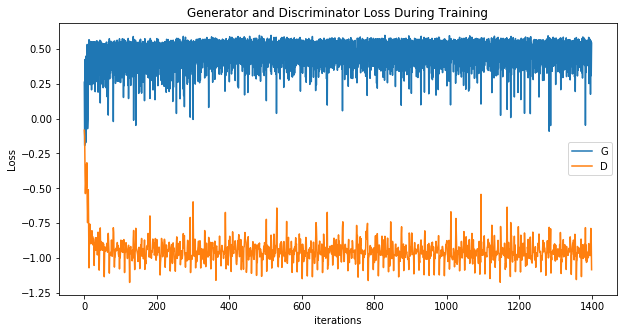

In [14]:
# Выводим на печать всяческие loss'ы
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

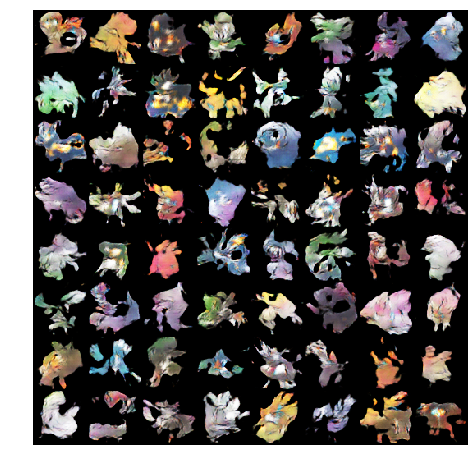

In [15]:
# Проигрываем результаты генерации для фиксированного шума
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

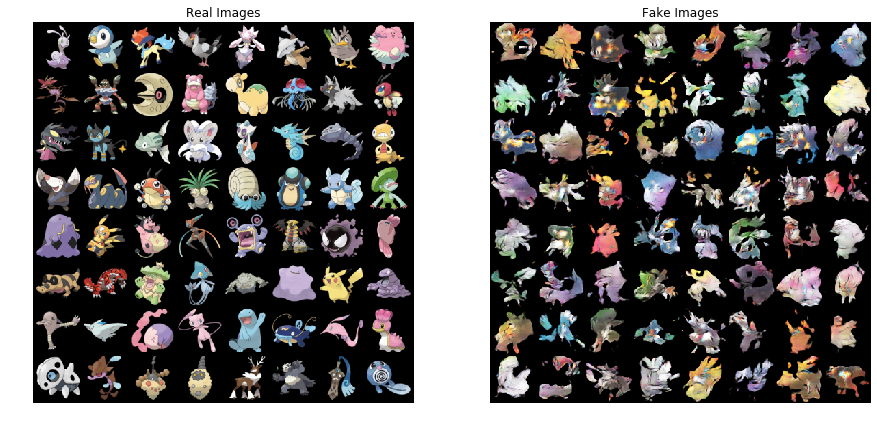

In [16]:
# Сравниваем настоящие данные и генерацию
real_batch = next(iter(dataloader))

# Рисуем трейнсет
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Рисуем фейки
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()